In [1]:
import sys
import argparse
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import os
import time
import json
from keras.models import model_from_json
from keras.preprocessing import image
from keras.applications.inception_v3 import preprocess_input
from keras.models import model_from_json
from keras.optimizers import SGD, RMSprop, Adagrad
import types
from IPython.display import Image as PyImage
from IPython.core.display import HTML
import gc

Using TensorFlow backend.


In [2]:
target_size = (229, 229) 

In [3]:
def generate_timestamp():
    timestring = time.strftime("%Y_%m_%d-%H_%M_%S")
    print ("Time stamp generated: "+timestring)
    return timestring

In [4]:
def is_valid_file(parser, arg):
    if not os.path.isfile(arg):
        parser.error("The file %s does not exist ..." % arg)
    else:
        return arg

In [5]:
def is_valid_dir(parser, arg):
    if not os.path.isdir(arg):
        parser.error("The folder %s does not exist ..." % arg)
    else:
        return arg

In [6]:
def load_prediction_model(args):
    try:
        print (args.config_file[0]) 
        with open(args.config_file[0]) as json_file:
              model_json = json_file.read()
        model = model_from_json(model_json)
    except:
          print ("Please specify a model configuration file ...")
          sys.exit(1)
    try:
          model.load_weights(args.weights_file[0])
          print ("Loaded model weights from: " + str(args.weights_file[0]))
    except:
          print ("Error loading model weights ...")
          sys.exit(1)
    try:
        print (args.labels_file[0])
        with open(args.labels_file[0]) as json_file:
            labels = json.load(json_file)
        print ("Loaded labels from: " + str(args.labels_file[0]))
    except:
        print ("No labels loaded ...")
        sys.exit(1)
    #compile_model(model)
    return model, labels

In [7]:
def plot_preds(preds, labels, timestr):
  output_loc = args.output_dir[0]
  output_file_preds = os.path.join(output_loc+"//preds_out_"+timestr+".png")
  fig = plt.figure()
  plt.axis('on')
  labels = labels
  plt.barh(list(range(0, len(labels))), preds, alpha=0.5)
  plt.yticks(list(range(0, len(labels))), labels)
  plt.xlabel('Probability')
  plt.xlim(0,1.01)
  plt.tight_layout()
  fig.savefig(output_file_preds, dpi=fig.dpi)
  plt.close()

In [8]:
def predict(model, img, target_size):
  print ("Running prediction model on the image file ...")
  if img.size != target_size:
    img = img.resize(target_size)

  _x_ = image.img_to_array(img)
  _x_ = np.expand_dims(_x_, axis=0)
  _x_ = preprocess_input(_x_)
  preds = model.predict(_x_)
  probabilities = model.predict(_x_, batch_size=1).flatten()
  prediction = labels[np.argmax(probabilities)]
  return preds[0], prediction

In [9]:
def gen_output(args, model, labels, target_size):
    if args.image is not None:
        img = Image.open(args.image[0])
        preds = predict(model, img, target_size)
        print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
        print (str(preds[1]))
        timestr = generate_timestamp()
        plot_preds(preds[0], labels, timestr)
        del (img)
        del (preds)
        return timestr

In [10]:
args = types.SimpleNamespace()
args.config_file = ['./model/model_efc.json']
args.weights_file = ['./model/trained_weights_36.model']
args.labels_file = ['./model/trained_labels.json']
args.output_dir = ['./output/']

In [11]:
model, labels = load_prediction_model(args)

./model/model_efc.json
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Loaded model weights from: ./model/trained_weights_36.model
./model/trained_labels.json
Loaded labels from: ./model/trained_labels.json


## Insitu:

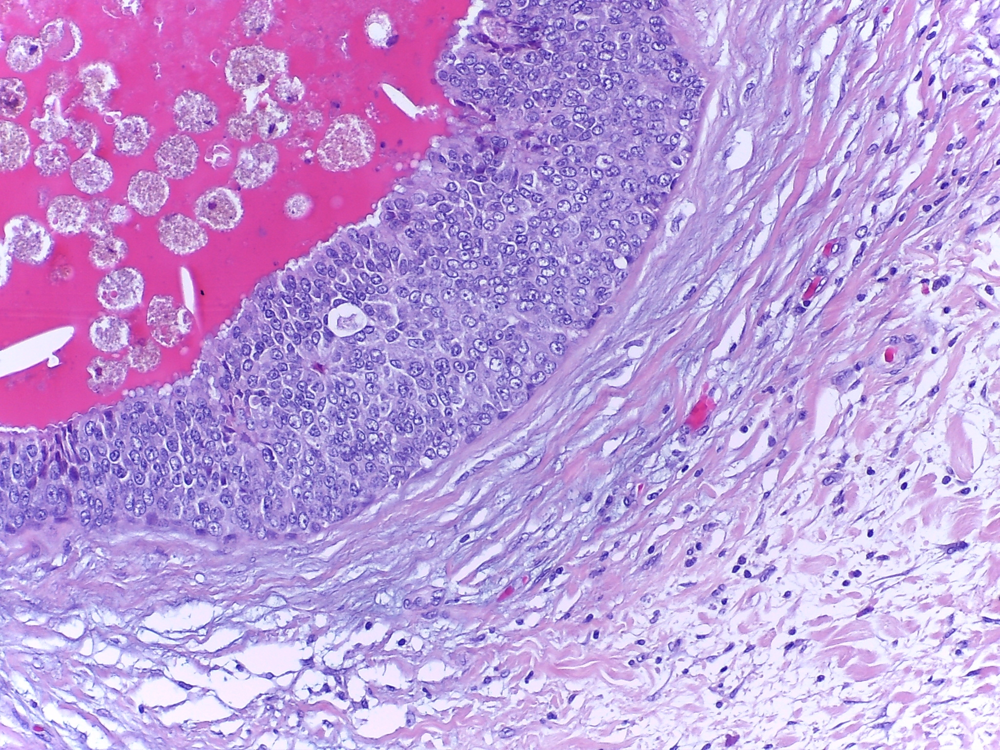

In [12]:
args.image = ['../../../data/ICIAR/test/insitu/10.jpg']
PyImage(args.image[0])

In [13]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Insitu	0.00	0.99	0.00	0.00
Insitu
Time stamp generated: 2017_12_28-13_13_12


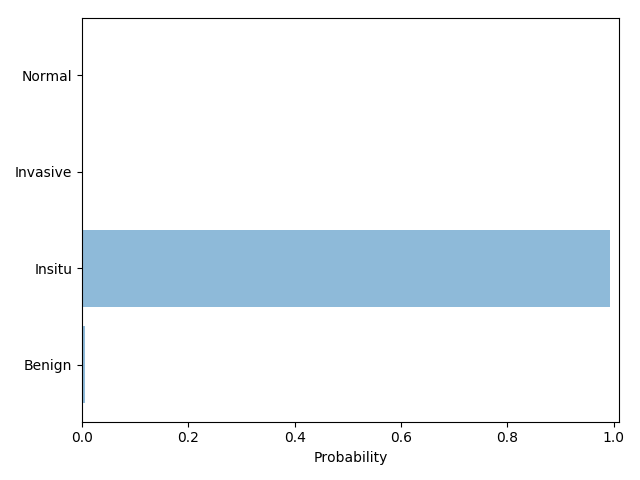

In [14]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [15]:
del (img_pred_plot)
del (timestr)
gc.collect()

89992

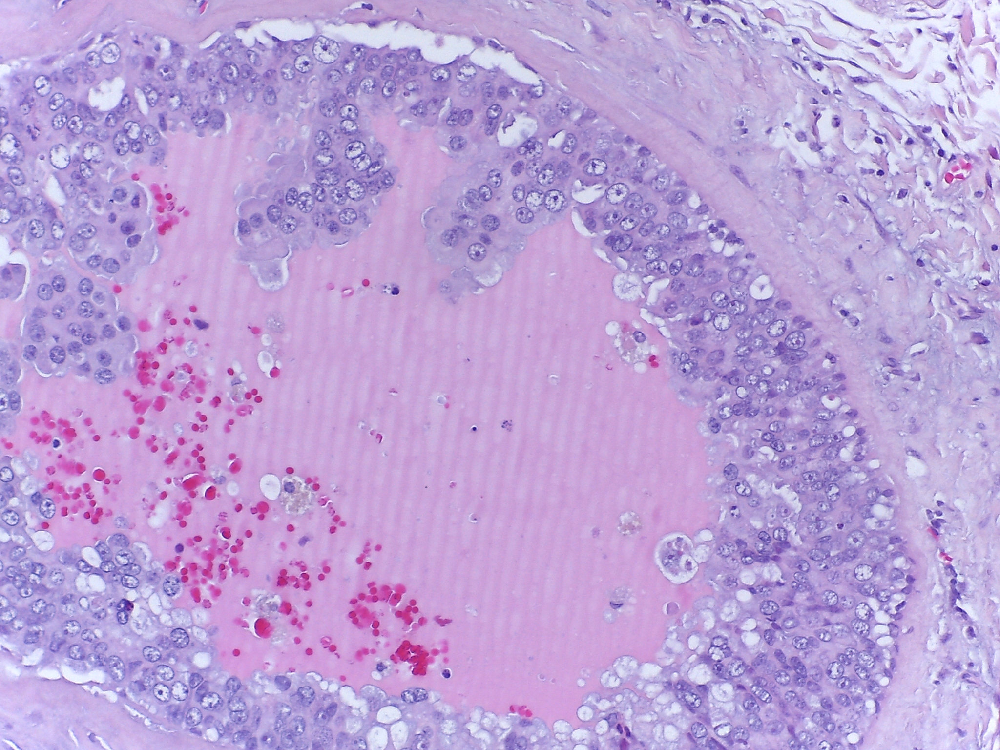

In [16]:
args.image = ['../../../data/ICIAR/test/insitu/11.jpg']
PyImage(args.image[0])

In [17]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Benign	1.00	0.00	0.00	0.00
Benign
Time stamp generated: 2017_12_28-13_13_15


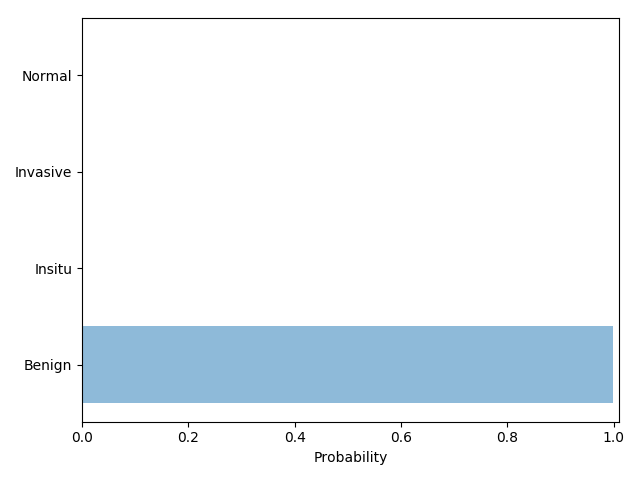

In [18]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [19]:
del (img_pred_plot)
del (timestr)
gc.collect()

2175

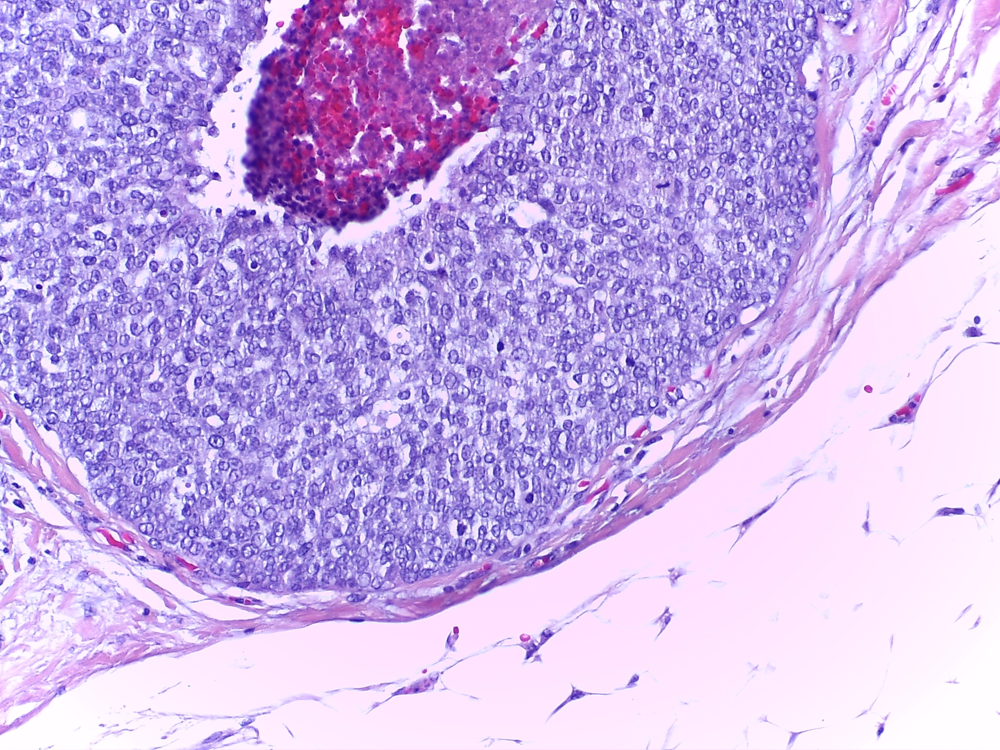

In [20]:
args.image = ['../../../data/ICIAR/test/insitu/12.jpg']
PyImage(args.image[0])

In [21]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Insitu	0.00	1.00	0.00	0.00
Insitu
Time stamp generated: 2017_12_28-13_13_15


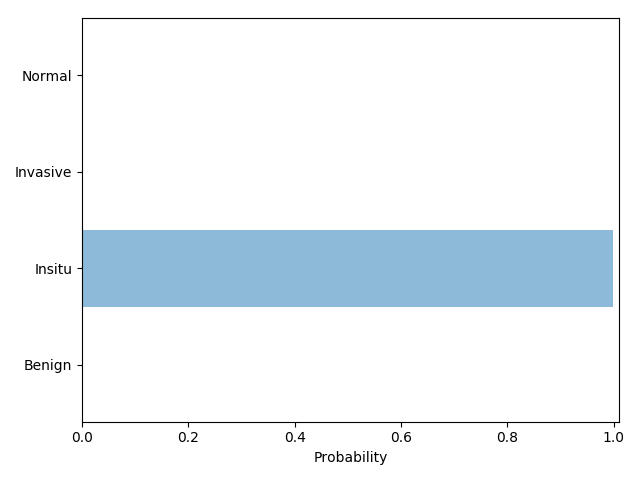

In [22]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [23]:
del (img_pred_plot)
del (timestr)
gc.collect()

2173

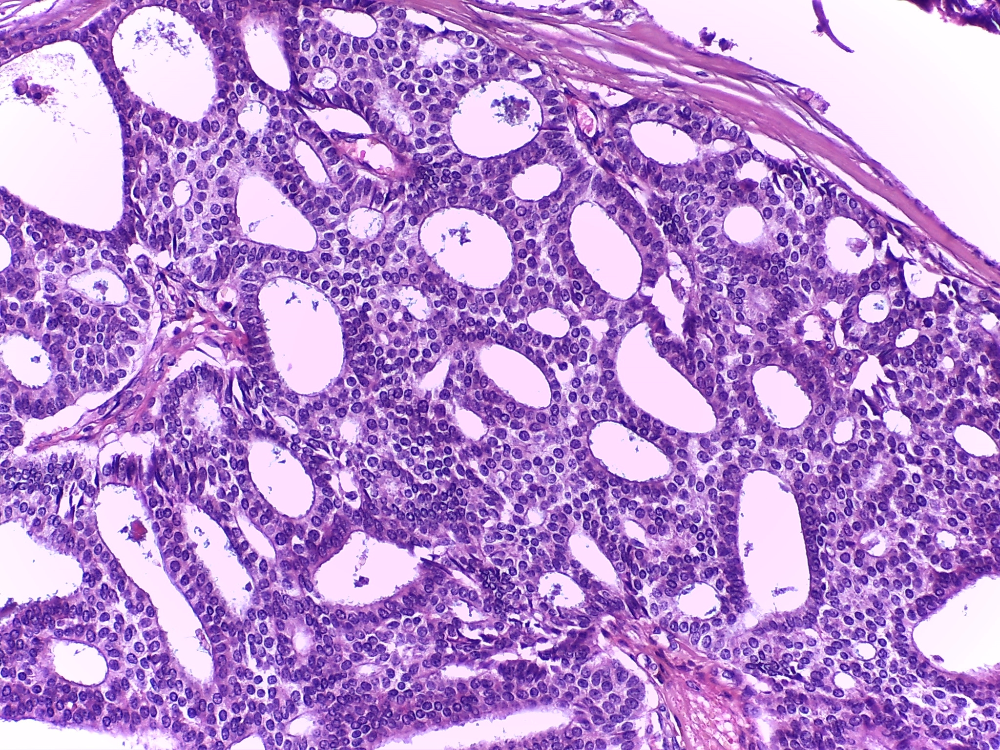

In [24]:
args.image = ['../../../data/ICIAR/test/insitu/13.jpg']
PyImage(args.image[0])

In [25]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Insitu	0.00	0.98	0.02	0.00
Insitu
Time stamp generated: 2017_12_28-13_13_16


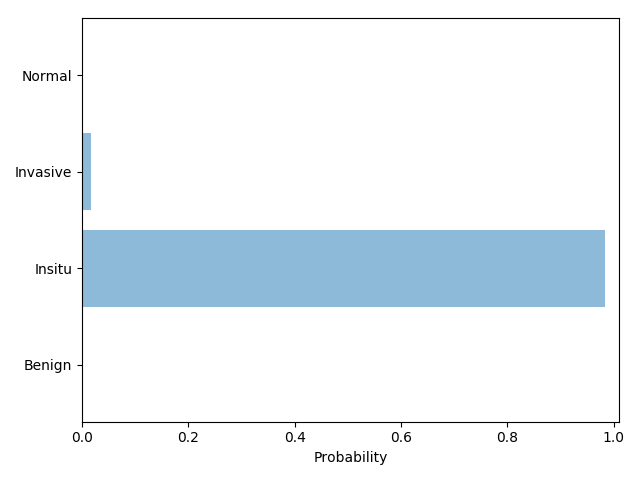

In [26]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [27]:
del (img_pred_plot)
del (timestr)
gc.collect()

2177

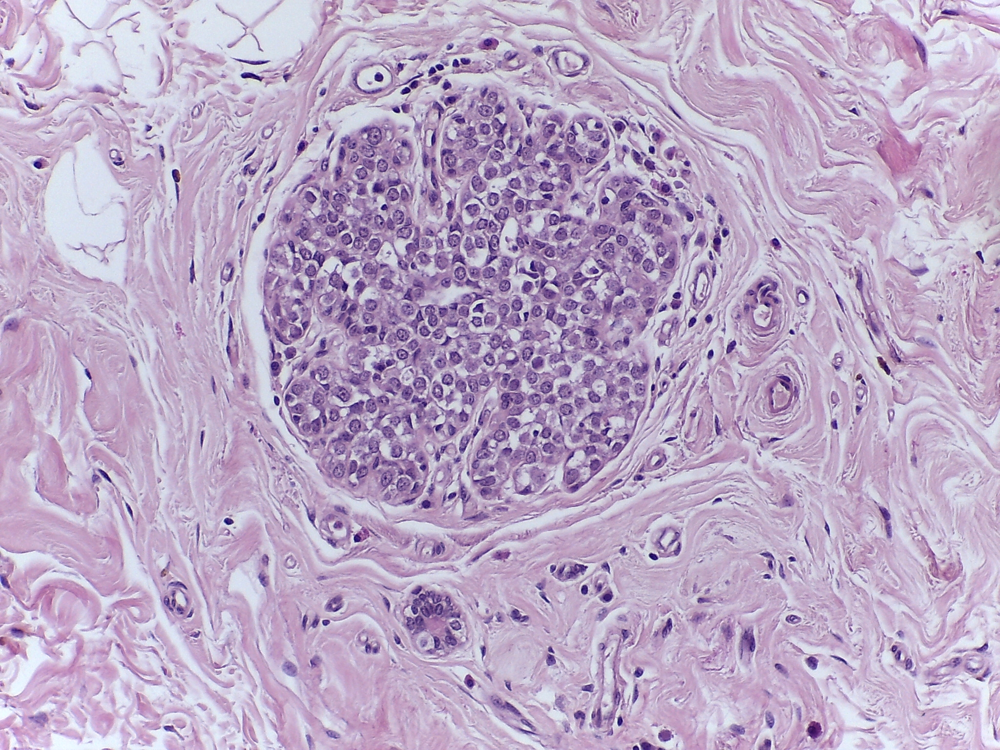

In [28]:
args.image = ['../../../data/ICIAR/test/insitu/14.jpg']
PyImage(args.image[0])

In [29]:
timestr = gen_output(args, model, labels, target_size)

Running prediction model on the image file ...
Insitu	0.01	0.96	0.01	0.03
Insitu
Time stamp generated: 2017_12_28-13_13_17


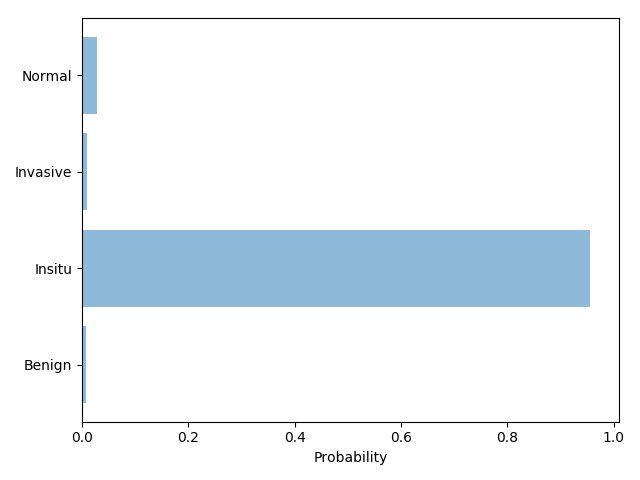

In [30]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [ ]:
del (img_pred_plot)
del (timestr)
gc.collect()

2171

In [ ]:
args.image = ['../../../data/ICIAR/test/insitu/28.jpg']
PyImage(args.image[0])

In [ ]:
timestr = gen_output(args, model, labels, target_size)

In [ ]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [ ]:
del (img_pred_plot)
del (timestr)
gc.collect()

In [ ]:
args.image = ['../../../data/ICIAR/test/insitu/29.jpg']
PyImage(args.image[0])

In [ ]:
timestr = gen_output(args, model, labels, target_size)

In [ ]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [ ]:
del (img_pred_plot)
del (timestr)
gc.collect()

In [ ]:
args.image = ['../../../data/ICIAR/test/insitu/30.jpg']
PyImage(args.image[0])

In [ ]:
timestr = gen_output(args, model, labels, target_size)

In [ ]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [ ]:
del (img_pred_plot)
del (timestr)
gc.collect()

In [ ]:
args.image = ['../../../data/ICIAR/test/insitu/31.jpg']
PyImage(args.image[0])

In [ ]:
timestr = gen_output(args, model, labels, target_size)

In [ ]:
img_pred_plot = os.path.join('./output/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [ ]:
del (img_pred_plot)
del (timestr)
gc.collect()